<a href="https://colab.research.google.com/github/anishbosegupta/Extern-Truebridge/blob/main/Trubridge_New_Jersey_Asthma_Map.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install --upgrade geopandas mapclassify folium
!pip install census contextily adjustText

In [ ]:
import geopandas as gpd
import pandas as pd
import time
from matplotlib import pyplot as plt
import mapclassify
import folium
import plotly.express as px
from shapely import wkt
#plt.rcParams["figure.figsize"] = (10,10) # set this once for a default plot size


In [ ]:
import json

geoj_file_path = "/content/sample_data/NJ_Counties_3857_-412578859711075066.geojson"

try:
    with open(geoj_file_path, 'r') as f:
        content = f.read()
        print(f"File size: {len(content)} characters")
        # Try to load as JSON to get a more specific error if it's malformed
        json_data = json.loads(content)
        print("GeoJSON file loaded successfully with json library (might be valid JSON, but not necessarily valid GeoJSON features).")

except json.JSONDecodeError as e:
    print(f"JSON decoding error: {e}")
    print("This indicates the GeoJSON file is likely malformed or truncated.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


File size: 7402540 characters
GeoJSON file loaded successfully with json library (might be valid JSON, but not necessarily valid GeoJSON features).


In [ ]:
nj_counties = gpd.read_file(geoj_file_path)
#asthma_ed_rate_nj_counties.head()

In [ ]:
asthma_ed_rate_nj_counties = pd.read_csv("/content/sample_data/asthma_ed_rate_nj_counties.csv", encoding='latin1')

In [ ]:
asthma_ed_rate_nj_counties

,County,Asthma_ED_Rate
0,Atlantic,71.2
1,Bergen,30.6
2,Burlington,50.1
3,Camden,96.2
4,Cape May,48.7
5,Cumberland,84.8
6,Essex,107.4
7,Gloucester,40.2
8,Hudson,60.8
9,Hunterdon,17.9


In [ ]:
nj_counties.explore()

<Axes: >

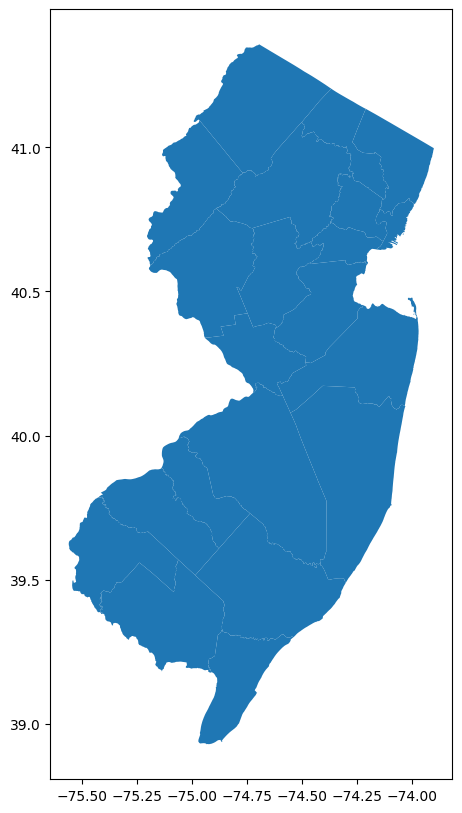

In [ ]:
# This map gives the counties of NJ filled in.
nj_counties.plot() # simple plot

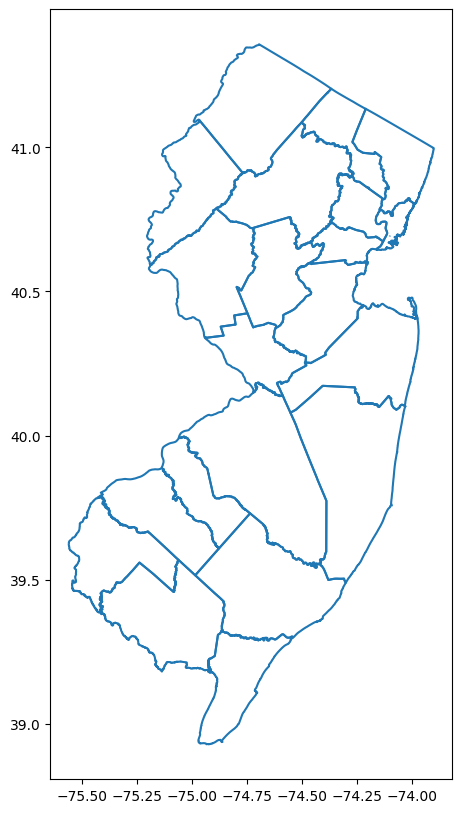

In [ ]:
# Change the County column in the asthma_ed_rate_nj_counties dataframe to upper and strip whitespace
asthma_ed_rate_nj_counties["County"] = asthma_ed_rate_nj_counties["County"].str.upper().str.strip()
# Merge NJ counties with asthma ed nj counties
merged_asthma_ed_rate = nj_counties.merge(asthma_ed_rate_nj_counties, left_on = "COUNTY", right_on = "County",how = "left")
merged_asthma_ed_rate.head()
merged_asthma_ed_rate.boundary.plot()
#Write the merged_asthma_ed_rate dataframe to a csv file
merged_asthma_ed_rate.to_csv("merged_asthma_ed_rate.csv")

<Axes: >

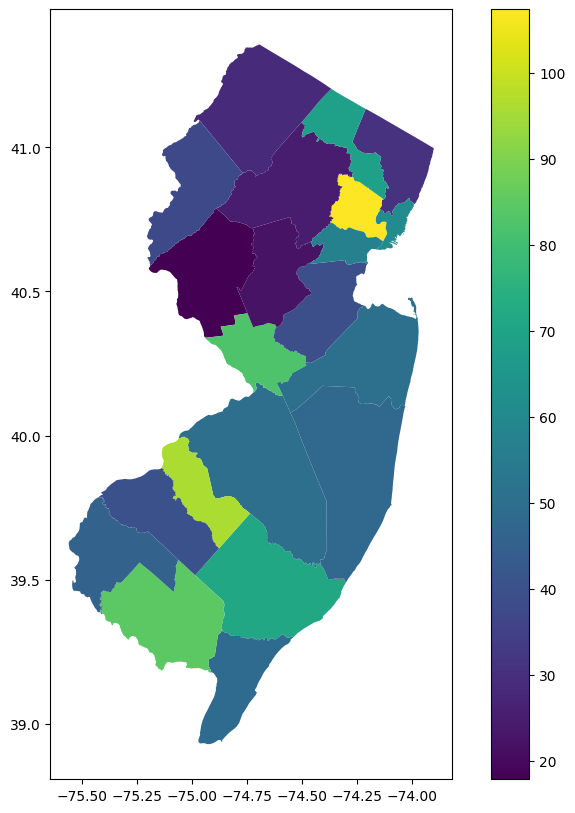

In [ ]:
#Make a map showing Asthma ED Rate using the merged_asthma_ed_rate
merged_asthma_ed_rate.plot(column = "Asthma_ED_Rate", legend = True)

In [ ]:
merged_asthma_ed_rate
# Select 3 columns from merged_asthma_ed_rate and get a new dataframe
merged_asthma = merged_asthma_ed_rate[["COUNTY", "Asthma_ED_Rate", "geometry"]].copy()
merged_asthma
# write the merged_asthma dataframe to a csv file
merged_asthma.to_csv("merged_asthma.csv")

In [ ]:

# Convert geometry to GeoJSON-compatible format
# This step ensures that the geometry column contains GeoJSON-compatible dictionaries.
# It checks if the geometry objects are already in dictionary format to prevent errors on re-execution.
merged_asthma["geometry"] = merged_asthma["geometry"].apply(lambda g: g.__geo_interface__ if hasattr(g, '__geo_interface__') else g)


/tmp/ipython-input-2130833736.py:4: UserWarning:

Geometry column does not contain geometry.



In [ ]:
geojson = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {
                "COUNTY": row["COUNTY"],
                "Asthma_ED_Rate": row["Asthma_ED_Rate"]
            },
            "geometry": row["geometry"]
        }
        for _, row in merged_asthma.iterrows()
    ]
}


In [ ]:
fig = px.choropleth(
    merged_asthma,
    geojson=geojson,
    locations="COUNTY",
    featureidkey="properties.COUNTY",
    color="Asthma_ED_Rate",
    color_continuous_scale="Reds",
    hover_name="COUNTY",
    hover_data={
        "Asthma_ED_Rate": ":.1f"
    },
    title="Asthma Emergency Department Visit Rate by County (New Jersey)",
    width=900,  # Increased width
    height=900  # Further adjusted height
)

fig.update_geos(
    fitbounds="locations",
    visible=False
)

fig.update_layout(
    margin={"r": 0, "t": 60, "l": 0, "b": 0},
    title_x=0.5,
    coloraxis_colorbar=dict(
        title="ED Visits<br>per 10,000"
    )
)

fig.show()


In [ ]:
import plotly.graph_objects as go
from shapely.geometry import shape

# Calculate centroids for labels
county_labels_data = []
for _, row in merged_asthma.iterrows():
    geom = shape(row["geometry"])
    county_labels_data.append({
        "COUNTY": row["COUNTY"],
        "lon": geom.centroid.x,
        "lat": geom.centroid.y
    })
county_labels_df = pd.DataFrame(county_labels_data)

# Add text labels to the map
fig.add_trace(
    go.Scattergeo(
        lon=county_labels_df["lon"],
        lat=county_labels_df["lat"],
        text=county_labels_df["COUNTY"],
        mode="text",
        textfont=dict(
            size=8,
            color="black"
        ),
        showlegend=False,
        hoverinfo="none"
    )
)

fig.show()


/tmp/ipython-input-2504117053.py:9: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




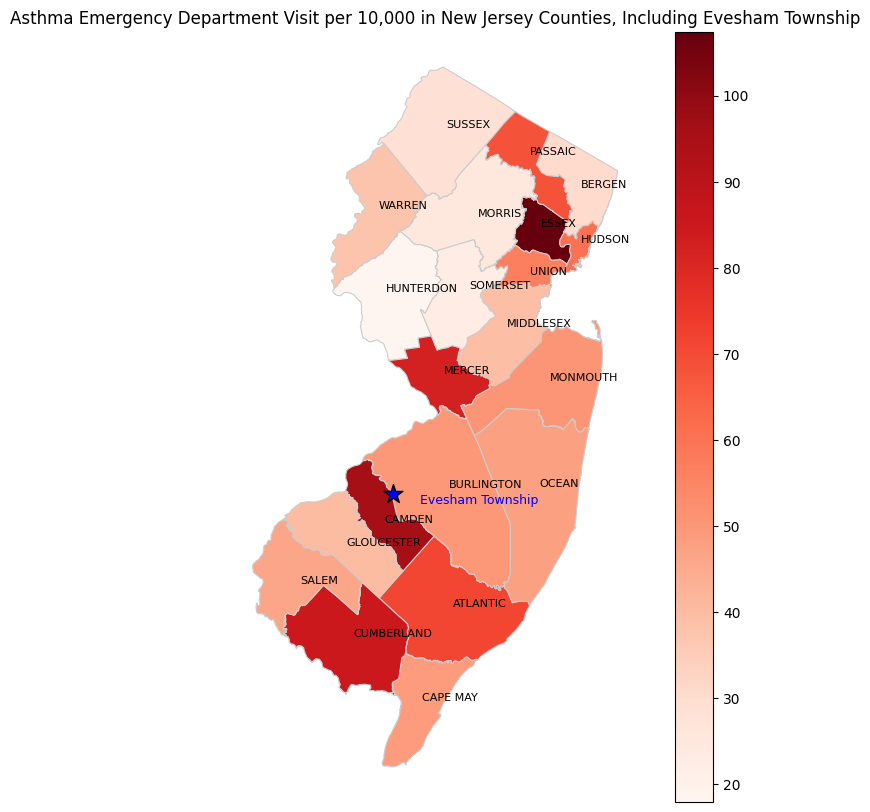

In [ ]:
from adjustText import adjust_text

# Create the Matplotlib plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
merged_asthma_ed_rate.plot(column="Asthma_ED_Rate", cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Add county labels
texts = []
for x, y, label in zip(merged_asthma_ed_rate.geometry.centroid.x, merged_asthma_ed_rate.geometry.centroid.y, merged_asthma_ed_rate["COUNTY"]):
    texts.append(plt.text(x, y, label, fontsize=8))

# Add Evesham Township with a star marker
evesham_lat = 39.8751
evesham_lon = -74.9220
ax.scatter(evesham_lon, evesham_lat, marker='*', color='blue', s=200, edgecolor='black', zorder=5, label='Evesham Township')
texts.append(plt.text(evesham_lon + 0.05, evesham_lat, 'Evesham Township', fontsize=9, color='blue', ha='left', va='center'))

# Adjust text to prevent overlapping
adjust_text(texts)

ax.set_title("Asthma Emergency Department Visit per 10,000 in New Jersey Counties, Including Evesham Township")
ax.set_axis_off()
plt.show()